# Evaluation Metrices

* `Importing Modules`

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from torch.utils.data import DataLoader
from torchvision import models
from torch import optim
from torch.utils.data import Dataset, DataLoader
import warnings

from PIL import Image
import numpy as np
import os, re
# !pip install torchinfo
# !pip install torchmetrics
# from torchmetrics.image import PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure
from scipy import linalg

import scipy.io as sio
from tqdm import tqdm
from scipy.ndimage import zoom
import glob
import cv2
import uuid
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
from pathlib import Path

## Directories


COVER_DIR_TRAIN = os.path.join(os.getcwd(), "drive", "MyDrive", "image steganography", "BSDS500", "images", "train" )
COVER_DIR_TEST = os.path.join(os.getcwd(), "drive", "MyDrive", "image steganography", "BSDS500", "images", "test")
COVER_DIR_VAL = os.path.join(os.getcwd(), "drive", "MyDrive", "image steganography", "BSDS500", "images", "val" )
EDGE_DIR_TRAIN = os.path.join(os.getcwd(), "drive", "MyDrive", "image steganography", "data", "jpg_edge_images", "train")

EDGE_DIR_OUTPUT_2_TRAIN = os.path.join(os.getcwd(), "drive", "MyDrive", "image steganography", "data", "jpg_edge_images","train")
EDGE_DIR_OUTPUT_2_TEST = os.path.join(os.getcwd(), "drive", "MyDrive", "image steganography", "data", "jpg_edge_images","test")
EDGE_DIR_OUTPUT_2_VAL = os.path.join(os.getcwd(), "drive", "MyDrive", "image steganography", "data", "jpg_edge_images","val")

# Model weights
CHECKPOINT_DIR = os.path.join(os.getcwd(), "drive", "MyDrive", "image steganography", "artifacts")
HIDING_NET_PATH = os.path.join(CHECKPOINT_DIR, "hiding_net.pth")
REVEAL_NET_PATH = os.path.join(CHECKPOINT_DIR, "reveal_net.pth")
CGANS_CHECKPOINT_PATH = os.path.join(CHECKPOINT_DIR, "cGANs_checkpoint_83.pth")
GENETIC_HED_PATH = os.path.join(CHECKPOINT_DIR, "hed_genetic.pth")
CNN_PATH_NEW = os.path.join(CHECKPOINT_DIR, "best_model_new.pth")


DATA_DIR = os.path.join(os.getcwd(), "drive", "MyDrive", "image steganography", "data")

# Edge output paths
HED_OUTPUT_DIR = os.path.join(DATA_DIR, "hed_predictions")
RCF_OUTPUT_DIR = os.path.join(DATA_DIR, "rcf_predictions")
PIDINET_OUTPUT_DIR = os.path.join(DATA_DIR, "pidinet_predictions")

# GANs OUTPUT Paths
HED_CGANS_DIR = os.path.join(DATA_DIR, "hed_cGANs")
RCF_CGANS_DIR = os.path.join(DATA_DIR, "rcf_cGANs")
PIDINET_CGANS_DIR = os.path.join(DATA_DIR, "pidinet_cGANs")

RCF_RESULTS = os.path.join(DATA_DIR,  "rcf_results")
STEGO_DIR = os.path.join(RCF_RESULTS, "CNN_stego")
DECODED_DIR = os.path.join(RCF_RESULTS, "CNN_decoded")

RCF_WGANS_STEGO = os.path.join(RCF_CGANS_DIR, "stego_images2")
RCF_WGANS_DECODED = os.path.join(RCF_CGANS_DIR, "extracted_images2")


# CNN results paths
HED_RESULTS = os.path.join(DATA_DIR,  "hed_results")
HED_STEGO_DIR = os.path.join(HED_RESULTS, "CNN_stego")
HED_DECODED_DIR = os.path.join(HED_RESULTS, "CNN_decoded")

RCF_RESULTS = os.path.join(DATA_DIR,  "rcf_results")
RCF_CNN_STEGO = os.path.join(RCF_RESULTS, "CNN_stego")
RCF_CNN_DECODED = os.path.join(RCF_RESULTS, "CNN_decoded")

HED_CNN_STEGO = os.path.join(RCF_RESULTS, "CNN_stego_2")
HED_CNN_DECODED = os.path.join(RCF_RESULTS, "CNN_decoded_2")

PIDINET_RESULTS = os.path.join(DATA_DIR,  "pidinet_results")
PIDINET_STEGO_DIR = os.path.join(PIDINET_RESULTS, "CNN_stego")
PIDINET_DECODED_DIR = os.path.join(PIDINET_RESULTS, "CNN_decoded")




# Genetics
GENETIC_OUTPUT_DIR = os.path.join(os.getcwd(), "drive", "MyDrive", "image steganography", "data", "genetic_predictions")



device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


## Create Evaluator class

In [ ]:
import os
import re
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math  # Added missing import
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from scipy.stats import pearsonr
from pathlib import Path
import warnings
import pandas as pd
from IPython.display import display, HTML
import random, math

# Suppress specific warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

class SteganographyEvaluator:
    def __init__(self, cover_dir, stego_dir, secret_dir, extracted_dir, output_dir=None, limit=None, resize=True):
        """
        Initialize paths to image directories
        """
        self.cover_dir = cover_dir
        self.stego_dir = stego_dir
        self.secret_dir = secret_dir
        self.extracted_dir = extracted_dir
        # self.output_dir = output_dir
        self.limit = limit
        self.resize = resize

        # Get common image IDs across all folders
        self.image_ids = self._find_common_image_ids()

        # Apply limit if specified
        if limit is not None and limit > 0 and limit < len(self.image_ids):
            self.image_ids = self.image_ids[:limit]

        print(f"Found {len(self.image_ids)} common images for evaluation")

    def _extract_image_id(self, filename):
        """Extract numeric ID from filename"""
        match = re.search(r'(\d+)', filename)
        if match:
            return match.group(1)
        return None

    def _find_common_image_ids(self):
        """Find image IDs that exist in all directories"""
        # Get all files in each directory
        cover_files = os.listdir(self.cover_dir)
        stego_files = os.listdir(self.stego_dir)
        secret_files = os.listdir(self.secret_dir)
        extracted_files = os.listdir(self.extracted_dir)

        # Extract IDs from filenames
        cover_ids = {self._extract_image_id(f): f for f in cover_files if self._extract_image_id(f)}
        stego_ids = {self._extract_image_id(f): f for f in stego_files if self._extract_image_id(f)}
        secret_ids = {self._extract_image_id(f): f for f in secret_files if self._extract_image_id(f)}
        extracted_ids = {self._extract_image_id(f): f for f in extracted_files if self._extract_image_id(f)}

        # Find common IDs
        common_ids = set(cover_ids.keys()) & set(stego_ids.keys()) & set(secret_ids.keys()) & set(extracted_ids.keys())

        # Create mapping of ID to filenames in each directory
        self.filename_map = {}
        for img_id in common_ids:
            self.filename_map[img_id] = {
                'cover': cover_ids[img_id],
                'stego': stego_ids[img_id],
                'secret': secret_ids[img_id],
                'extracted': extracted_ids[img_id]
            }

        return sorted(list(common_ids))

    def load_image(self, path, grayscale=False):
        """Load an image from path"""
        if grayscale:
            return cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        img = cv2.imread(path)
        if img is None:
            raise ValueError(f"Could not load image at {path}")
        return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    def resize_to_match(self, img1, img2):
        """Resize img2 to match dimensions of img1"""
        if img1.shape[:2] != img2.shape[:2]:
            return cv2.resize(img2, (img1.shape[1], img1.shape[0]), interpolation=cv2.INTER_AREA)
        return img2

    def calculate_payload_capacity(self, cover_image):
        """
        Calculate the payload capacity in steganographic images based on the cover image.
        """
        # Assuming each pixel in the cover image contains 8 bits (1 byte) for grayscale images
        # For color images, adjust the number of bytes per pixel accordingly (e.g., 3 bytes for RGB images)
        bytes_per_pixel = 3  # 1 byte for grayscale images

        # Calculate the total number of pixels in the cover image
        total_pixels = cover_image.shape[0] * cover_image.shape[1]

        # Calculate the payload capacity in bits
        payload_capacity_bits = total_pixels * bytes_per_pixel * 8

        return payload_capacity_bits

    def calculate_bpp(self, cover_image):
        """
        Calculate the Bits Per Pixel (BPP) for a steganographic image.
        """
        # Get the dimensions of the image
        height, width = cover_image.shape[:2]

        # Determine the number of layers (channels) in the image
        if len(cover_image.shape) == 2:
            # Grayscale image (1 channel)
            num_layers = 1
        else:
            # Color image (3 or 4 channels: RGB or RGBA)
            num_layers = cover_image.shape[2]

        # Calculate Bits Per Pixel (BPP)
        bpp = self.calculate_payload_capacity(cover_image) / (width * height * num_layers)

        return bpp

    def calculate_ssim(self, cover_image, stego_image):
        """
        Calculate the Structural Similarity Index Measure (SSIM) between two images.
        """
        stego_image = self.resize_to_match(cover_image, stego_image)

        # Convert to grayscale if the images are not already
        if len(cover_image.shape) == 3:
            cover_gray = cv2.cvtColor(cover_image, cv2.COLOR_RGB2GRAY)
            stego_gray = cv2.cvtColor(stego_image, cv2.COLOR_RGB2GRAY)
        else:
            cover_gray = cover_image
            stego_gray = stego_image

        # Use skimage's implementation
        ssim_value = ssim(cover_gray, stego_gray)
        return ssim_value

    def calculate_image_fidelity(self, cover_image, stego_image):
        """
        Calculate the Image Fidelity (IF) between two images.
        """
        stego_image = self.resize_to_match(cover_image, stego_image)
        # Ensure images are of the same dimensions
        assert cover_image.shape == stego_image.shape, "Images must have the same dimensions."

        # Normalize the images to the range [0, 1]
        cover_image = cover_image.astype('float32') / 255.0
        stego_image = stego_image.astype('float32') / 255.0

        # Calculate the squared differences
        squared_diff = (cover_image - stego_image) ** 2

        # Calculate the sum of squared differences
        sum_squared_diff = np.sum(squared_diff)

        # Calculate the sum of squared pixel values in the cover image
        sum_squared_cover = np.sum(cover_image ** 2)

        # Calculate Image Fidelity (IF)
        if_value = 1 - (sum_squared_diff / sum_squared_cover)

        return if_value


    def calculate_2d_cc(self, original_image, extracted_image):
        """
        Calculate the 2D Correlation Coefficient (CC) between two images.
        """
        extracted_image = self.resize_to_match(original_image, extracted_image)
        # Ensure the images have the same dimensions
        assert original_image.shape == extracted_image.shape, "Images must have the same dimensions."

        # Flatten the images into 1D arrays
        original_flat = original_image.flatten().astype('float32')
        extracted_flat = extracted_image.flatten().astype('float32')

        # Calculate the means of the images
        mean_original = np.mean(original_flat)
        mean_extracted = np.mean(extracted_flat)

        # Calculate the numerator
        numerator = np.sum((original_flat - mean_original) * (extracted_flat - mean_extracted))

        # Calculate the denominator
        denominator = np.sqrt(
            np.sum((original_flat - mean_original) ** 2) * np.sum((extracted_flat - mean_extracted) ** 2)
        )

        # Calculate the 2D Correlation Coefficient (CC)
        cc = numerator / denominator if denominator != 0 else 0

        return cc

    def calculate_bit_error_rate(self, original_image, extracted_image):
        extracted_image = self.resize_to_match(original_image, extracted_image)

        # Convert to gray if not already
        if len(original_image.shape) == 3:
            original_gray = cv2.cvtColor(original_image, cv2.COLOR_RGB2GRAY)
            extracted_gray = cv2.cvtColor(extracted_image, cv2.COLOR_RGB2GRAY)
        else:
            original_gray = original_image
            extracted_gray = extracted_image

        # Binarize the images (threshold at midpoint)
        _, original_bin = cv2.threshold(original_gray, 127, 255, cv2.THRESH_BINARY)
        _, extracted_bin = cv2.threshold(extracted_gray, 127, 255, cv2.THRESH_BINARY)

        # Count different bits
        different_bits = np.sum(original_bin != extracted_bin)
        total_bits = original_bin.size * 8  # 8 bits per pixel

        # Calculate BER
        ber = different_bits / total_bits

        return ber

    def calculate_ssim(self, cover_image, stego_image, c1=0.01, c2=0.03):
        stego_image = self.resize_to_match(cover_image, stego_image)
        # Ensure images are of the same dimensions
        assert cover_image.shape == stego_image.shape, "Images must have the same dimensions."

        # Normalize the images to the range [0, 1]
        cover_image = cover_image.astype('float32') / 255.0
        stego_image = stego_image.astype('float32') / 255.0

        # Calculate means
        mu_x = np.mean(cover_image)
        mu_y = np.mean(stego_image)

        # Calculate variances and covariance
        sigma_x2 = np.var(cover_image)
        sigma_y2 = np.var(stego_image)
        sigma_xy = np.cov(cover_image.flatten(), stego_image.flatten())[0, 1]

        # Calculate SSIM
        numerator = (2 * mu_x * mu_y + c1) * (2 * sigma_xy + c2)
        denominator = (mu_x**2 + mu_y**2 + c1) * (sigma_x2 + sigma_y2 + c2)
        ssim = numerator / denominator

        return ssim

    def calculate_if(self, cover_image, stego_image):
        stego_image = self.resize_to_match(cover_image, stego_image)
        # Ensure images are of the same dimensions
        assert cover_image.shape == stego_image.shape, "Images must have the same dimensions."

        # Normalize the images to the range [0, 1]
        cover_image = cover_image.astype('float32') / 255.0
        stego_image = stego_image.astype('float32') / 255.0

        # Calculate the squared differences
        squared_diff = (cover_image - stego_image) ** 2

        # Calculate the sum of squared differences
        sum_squared_diff = np.sum(squared_diff)

        # Calculate the sum of squared pixel values in the cover image
        sum_squared_cover = np.sum(cover_image ** 2)

        # Calculate Image Fidelity (IF)
        if_value = 1 - (sum_squared_diff / sum_squared_cover)

        return if_value

    def calculate_2d_cc(self, original_image, extracted_image):
        extracted_image = self.resize_to_match(original_image, extracted_image)
        # Ensure the images have the same dimensions
        assert original_image.shape == extracted_image.shape, "Images must have the same dimensions."

        # Flatten the images into 1D arrays
        original_flat = original_image.flatten().astype('float32')
        extracted_flat = extracted_image.flatten().astype('float32')

        # Calculate the means of the images
        mean_original = np.mean(original_flat)
        mean_extracted = np.mean(extracted_flat)

        # Calculate the numerator
        numerator = np.sum((original_flat - mean_original) * (extracted_flat - mean_extracted))

        # Calculate the denominator
        denominator = np.sqrt(
            np.sum((original_flat - mean_original) ** 2) * np.sum((extracted_flat - mean_extracted) ** 2)
        )

        # Calculate the 2D Correlation Coefficient (CC)
        cc = numerator / denominator if denominator != 0 else 0

        return cc

    def calculate_re_images(self, original_image, extracted_image):
        extracted_image = self.resize_to_match(original_image, extracted_image)
        # Ensure the images have the same dimensions
        assert original_image.shape == extracted_image.shape, "Images must have the same dimensions."

        # Flatten the images into 1D arrays
        original_flat = original_image.flatten()
        extracted_flat = extracted_image.flatten()

        # Convert pixel values to 8-bit binary strings
        original_binary = np.unpackbits(original_flat)
        extracted_binary = np.unpackbits(extracted_flat)

        # Calculate the number of error bits using XOR
        error_bits = np.sum(original_binary != extracted_binary)

        # Calculate the total number of bits in the original image
        total_bits = len(original_binary)

        # Calculate the Error Rate Extraction (Re)
        re = error_bits / total_bits

        return re

    def calculate_pov_metrics(self, image, direction='horizontal'):
        # Convert the image to grayscale if it is not already
        if len(image.shape) == 3:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # Initialize an empty list to store differences
        differences = []

        # Analyze horizontal pairs
        if direction == 'horizontal':
            for i in range(image.shape[0]):  # Rows
                for j in range(image.shape[1] - 1):  # Columns (skip the last pixel)
                    diff = int(image[i, j]) - int(image[i, j + 1])  # Difference between neighboring pixels
                    differences.append(diff)

        # Analyze vertical pairs
        elif direction == 'vertical':
            for j in range(image.shape[1]):  # Columns
                for i in range(image.shape[0] - 1):  # Rows (skip the last pixel)
                    diff = int(image[i, j]) - int(image[i + 1, j])  # Difference between neighboring pixels
                    differences.append(diff)

        # Convert differences to a NumPy array
        differences = np.array(differences)

        # Calculate variance and standard deviation
        variance = np.var(differences)
        std_dev = np.std(differences)

        return variance, std_dev

    def chi_square_test(self, cover_image, stego_image):
        # Convert to grayscale if the images are not already
        if len(cover_image.shape) == 3:
            cover_image = cv2.cvtColor(cover_image, cv2.COLOR_BGR2GRAY)
        if len(stego_image.shape) == 3:
            stego_image = cv2.cvtColor(stego_image, cv2.COLOR_BGR2GRAY)

        stego_image = self.resize_to_match(cover_image, stego_image)
        # Calculate histograms for both cover and stego images
        cover_hist = cv2.calcHist([cover_image], [0], None, [256], [0, 256])
        stego_hist = cv2.calcHist([stego_image], [0], None, [256], [0, 256])

        # Normalize the histograms (to avoid differences in image size)
        cover_hist /= cover_hist.sum()
        stego_hist /= stego_hist.sum()

        # Calculate Chi-square value
        chi_square_value = 0.5 * np.sum(((cover_hist - stego_hist) ** 2) / (cover_hist + stego_hist + 1e-10))
        return chi_square_value

    def calculate_mse(self, cover_image, stego_image):
        stego_image = self.resize_to_match(cover_image, stego_image)
      # Ensure images are of the same dimensions
        assert cover_image.shape == stego_image.shape, "Images must have the same dimensions."

        # Normalize the pixel values to the range [0, 1]
        cover_image = cover_image.astype('float32') / 255.0
        stego_image = stego_image.astype('float32') / 255.0

        # Get the dimensions of the images
        height, width, channels = cover_image.shape

        # Initialize the sum of squared differences
        sum_squared_diff = 0

        # Iterate through each pixel and channel
        for i in range(height):
            for j in range(width):
                for k in range(channels):
                    # Calculate the squared difference for each pixel and channel
                    diff = cover_image[i, j, k] - stego_image[i, j, k]
                    sum_squared_diff += diff ** 2

        # Calculate the total number of pixels (including all channels)
        total_pixels = height * width * channels

        # Compute the MSE
        mse = sum_squared_diff / total_pixels
        return mse

    def calculate_psnr(self, stego_image, cover_image):
        mse = self.calculate_mse(stego_image, cover_image)
        max_pixel_value = 1.0  # Assuming pixel values are normalized to [0, 1]
        if mse == 0:
            return float('inf')
        psnr = 10 * math.log10((max_pixel_value ** 2) / mse)
        return psnr, mse

    #---------------- Rs Analysis--------------------------
    def discriminant_function(self, image):
        """
        Discriminant function to quantify a property of the image.
        """
        diff_x = np.abs(image[:, 1:] - image[:, :-1])  # Horizontal differences
        diff_y = np.abs(image[1:, :] - image[:-1, :])  # Vertical differences
        return np.sum(diff_x) + np.sum(diff_y)

    def flip_operation(self, image, mask):
        """
        Flip operation to apply a mask to the image in a sliding window manner.
        The mask flips the LSB of specific pixels.
        """
        flipped_image = np.copy(image)
        height, width = image.shape
        mask_height, mask_width = mask.shape
        for i in range(height - mask_height + 1):
            for j in range(width - mask_width + 1):
                block = image[i:i+mask_height, j:j+mask_width]
                flipped_block = np.where(mask == 1, block ^ 1, block)
                flipped_image[i:i+mask_height, j:j+mask_width] = flipped_block
        return flipped_image

    def rs_analysis(self, image, mask):
        """
        Perform RS analysis on the image.
        """
        flipped_image = self.flip_operation(image, mask)
        f_original = self.discriminant_function(image)
        f_flipped = self.discriminant_function(flipped_image)
        if f_flipped > f_original:
            group = 'R'
        elif f_flipped < f_original:
            group = 'S'
        else:
            group = 'U'
        return group, f_original, f_flipped, flipped_image

    def calculate_rs_analysis(self, stego_image):
        """
        Calculate RS analysis metrics for the stego image.
        """
        if len(stego_image.shape) == 3:
            stego_gray = cv2.cvtColor(stego_image, cv2.COLOR_RGB2GRAY)
        else:
            stego_gray = stego_image

        mask_positive = np.array([[0, 1], [1, 0]])  # Positive mask M = (0 1 1 0)
        mask_negative = np.array([[1, 0], [0, 1]])  # Negative mask -M = (1 0 0 1)
        group_positive, f_original_positive, f_flipped_positive, flipped_image_positive = self.rs_analysis(stego_gray, mask_positive)
        group_negative, f_original_negative, f_flipped_negative, flipped_image_negative = self.rs_analysis(stego_gray, mask_negative)
        is_resistant = group_positive == 'R' and group_negative == 'R'
        return {
            'rs_group_positive': group_positive,
            'rs_group_negative': group_negative,
            'rs_is_resistant': is_resistant,
            'rs_f_original_positive': f_original_positive,
            'rs_f_flipped_positive': f_flipped_positive,
            'rs_f_original_negative': f_original_negative,
            'rs_f_flipped_negative': f_flipped_negative,
            'rs_flipped_image_positive': flipped_image_positive,
            'rs_flipped_image_negative': flipped_image_negative
        }

    def rs_analysis_extended(self, cover_image, stego_image):
        """Calculate extended RS analysis (ranked differences)"""
        if len(cover_image.shape) == 3:
            cover_gray = cv2.cvtColor(cover_image, cv2.COLOR_RGB2GRAY)
        else:
            cover_gray = cover_image
        if len(stego_image.shape) == 3:
            stego_gray = cv2.cvtColor(stego_image, cv2.COLOR_RGB2GRAY)
        else:
            stego_gray = stego_image
        stego_gray = self.resize_to_match(cover_gray, stego_gray)
        diff = np.abs(cover_gray - stego_gray)
        diff_flat = diff.flatten()
        ranked_diff = np.sort(diff_flat)
        unique_values, counts = np.unique(ranked_diff, return_counts=True)
        return ranked_diff, unique_values, counts

    def apply_random_substitution(self, cover_array, substitution_rate=0.05):
        """Randomly substitute pixel values to simulate noise"""
        altered_array = cover_array.copy()
        num_pixels = cover_array.shape[0] * cover_array.shape[1] * cover_array.shape[2]
        num_substitutions = int(num_pixels * substitution_rate)
        for _ in range(num_substitutions):
            i = random.randint(0, cover_array.shape[0] - 1)
            j = random.randint(0, cover_array.shape[1] - 1)
            c = random.randint(0, 2)
            altered_array[i, j, c] = random.randint(0, 255)
        return altered_array

    def compute_difference(self, cover_img, stego_img):
        """Compute absolute difference between cover and stego images"""
        stego_img = self.resize_to_match(cover_img, stego_img)
        return np.abs(cover_img - stego_img)

    def calculate_rs_analysis_extended(self, cover_image, stego_image):
        """Calculate extended RS analysis metrics"""
        ranked_diff, unique_values, counts = self.rs_analysis_extended(cover_image, stego_image)
        altered_cover = self.apply_random_substitution(cover_image, substitution_rate=0.05)
        mse_value = self.calculate_mse(altered_cover, stego_image)
        max_mse = 255**2
        normalized_mse = mse_value / max_mse
        diff_img = self.compute_difference(cover_image, stego_image)
        return {
            'rs_ranked_diff': ranked_diff,
            'rs_unique_values': unique_values,
            'rs_counts': counts,
            'rs_mse_altered': mse_value,
            'rs_normalized_mse': normalized_mse,
            'rs_altered_cover': altered_cover,
            'rs_diff_img': diff_img
        }

    def raw_quick_pair_analysis(self, image):
        """Perform Raw Quick Pair analysis on the image"""
        suspicious_pairs = []
        height, width = image.shape[:2]
        for x in range(width - 1):
            for y in range(height):
                pixel1 = tuple(image[y, x])
                pixel2 = tuple(image[y, x + 1])
                if pixel1 != pixel2:
                    suspicious_pairs.append(((x, y), (x + 1, y)))
        return suspicious_pairs

    def calculate_rqp_analysis(self, stego_image):
        """Calculate Raw Quick Pair analysis metrics"""
        suspicious_pairs = self.raw_quick_pair_analysis(stego_image)
        return {
            'rqp_suspicious_pairs': suspicious_pairs,
            'rqp_pair_count': len(suspicious_pairs)
        }

    def single_pixel_attack(self, image):
        """Perform Single Pixel Attack on the image"""
        height, width, channels = image.shape
        x = random.randint(0, height - 1)
        y = random.randint(0, width - 1)
        original_pixel = image[x, y].copy()
        modified_pixel = 255 - original_pixel
        modified_image = image.copy()
        modified_image[x, y] = modified_pixel
        return modified_image, (x, y), original_pixel, modified_pixel

    def calculate_spa_analysis(self, cover_image, stego_image):
        """Calculate Single Pixel Attack analysis metrics"""
        if len(cover_image.shape) == 3:
            cover_gray = cv2.cvtColor(cover_image, cv2.COLOR_RGB2GRAY)
        else:
            cover_gray = cover_image
        if len(stego_image.shape) == 3:
            stego_gray = cv2.cvtColor(stego_image, cv2.COLOR_RGB2GRAY)
        else:
            stego_gray = stego_image
        modified_stego, position, original_pixel, modified_pixel = self.single_pixel_attack(stego_image)
        modified_stego_gray = cv2.cvtColor(modified_stego, cv2.COLOR_RGB2GRAY) if len(modified_stego.shape) == 3 else modified_stego
        ssim_before = self.calculate_ssim(cover_image, stego_image)
        ssim_after = ssim(cover_gray, modified_stego_gray, data_range=255)
        return {
            'spa_modified_image': modified_stego,
            'spa_position': position,
            'spa_original_pixel': original_pixel,
            'spa_modified_pixel': modified_pixel,
            'spa_ssim_before': ssim_before,
            'spa_ssim_after': ssim_after
        }

    def create_paths_from_id(self, img_id):
        # Get filenames for this ID
        filenames = self.filename_map[img_id]

        # Load images
        cover_path = os.path.join(self.cover_dir, filenames['cover'])
        stego_path = os.path.join(self.stego_dir, filenames['stego'])
        secret_path = os.path.join(self.secret_dir, filenames['secret'])
        extracted_path = os.path.join(self.extracted_dir, filenames['extracted'])

        return cover_path, stego_path, secret_path, extracted_path

    def evaluate_single_image_set(self, img_id):
        """Evaluate metrics for a single set of images identified by ID"""

        # Get filenames for this ID
        filenames = self.filename_map[img_id]

        # Load images
        cover_path = os.path.join(self.cover_dir, filenames['cover'])
        stego_path = os.path.join(self.stego_dir, filenames['stego'])
        secret_path = os.path.join(self.secret_dir, filenames['secret'])
        extracted_path = os.path.join(self.extracted_dir, filenames['extracted'])

        cover = self.load_image(cover_path)
        stego = self.load_image(stego_path)
        secret = self.load_image(secret_path)
        extracted = self.load_image(extracted_path)

        # Store original images without resizing for visualization
        orig_images = {
            'cover_orig': cover.copy(),
            'stego_orig': stego.copy(),
            'secret_orig': secret.copy(),
            'extracted_orig': extracted.copy()
        }

        # Resize images to match dimensions before calculations
        if self.resize:
            # Choose one image as the reference size (usually cover is the reference)
            stego = self.resize_to_match(cover, stego)
            # Resize secret and extracted to match each other
            extracted = self.resize_to_match(secret, extracted)

        # Convert to grayscale for some metrics
        cover_gray = cv2.cvtColor(cover, cv2.COLOR_RGB2GRAY) if len(cover.shape) == 3 else cover
        stego_gray = cv2.cvtColor(stego, cv2.COLOR_RGB2GRAY) if len(stego.shape) == 3 else stego

        # Calculate metrics
        psnr_hide, mse_hide = self.calculate_psnr(cover, stego)
        psnr_reveal, mse_reveal = self.calculate_psnr(secret, extracted)

        ssim_hide = self.calculate_ssim(cover, stego)
        ssim_reveal = self.calculate_ssim(secret, extracted)

        if_hide = self.calculate_if(cover, stego)
        if_reveal = self.calculate_if(secret, extracted)

        cc_value = self.calculate_2d_cc(cover, stego)
        bpp_value = self.calculate_bpp(cover)
        ber_value = self.calculate_bit_error_rate(secret, extracted)
        chi_square_value = self.chi_square_test(cover_gray, stego_gray)
        re_value = self.calculate_re_images(secret, extracted)
        pc_value = self.calculate_payload_capacity(cover)
        horizontal_variance, horizontal_std_dev = self.calculate_pov_metrics(stego, 'horizontal')
        vertical_variance, vertical_std_dev = self.calculate_pov_metrics(stego, 'vertical')
        rs_metrics = self.calculate_rs_analysis(stego)
        rs_extended_metrics = self.calculate_rs_analysis_extended(cover, stego)
        rqp_metrics = self.calculate_rqp_analysis(stego)
        spa_metrics = self.calculate_spa_analysis(cover, stego)

        results = {
            "id": img_id,
            "cover_file": filenames['cover'],
            "stego_file": filenames['stego'],
            "secret_file": filenames['secret'],
            "extracted_file": filenames['extracted'],

            # capacity
            "payload_capacity": pc_value,
            "bpp": bpp_value,

            # Image quality metrics
            "mse_hide": mse_hide,
            "mse_reveal": mse_reveal,
            "psnr_hide": psnr_hide,
            "psnr_reveal": psnr_reveal,
            "ssim_hide": ssim_hide,
            "ssim_reveal": ssim_reveal,
            "if_hide": if_hide,
            "if_reveal": if_reveal,

            # Robustness
            "ber": ber_value,
            "cc": cc_value,
            "extraction_error_rate": re_value,

            # security
            "horizontal_variance": horizontal_variance,
            "horizontal_std_dev": horizontal_std_dev,
            "vertical_variance": vertical_variance,
            "vertical_std_dev": vertical_std_dev,
            "chi_square": chi_square_value,

            # RS Analysis
            "rs_group_positive": rs_metrics['rs_group_positive'],
            "rs_group_negative": rs_metrics['rs_group_negative'],
            "rs_is_resistant": rs_metrics['rs_is_resistant'],
            "rs_f_original_positive": rs_metrics['rs_f_original_positive'],
            "rs_f_flipped_positive": rs_metrics['rs_f_flipped_positive'],
            "rs_f_original_negative": rs_metrics['rs_f_original_negative'],
            "rs_f_flipped_negative": rs_metrics['rs_f_flipped_negative'],

            # Extended RS Analysis
            "rs_ranked_diff": rs_extended_metrics['rs_ranked_diff'],
            "rs_unique_values": rs_extended_metrics['rs_unique_values'],
            "rs_counts": rs_extended_metrics['rs_counts'],
            "rs_mse_altered": rs_extended_metrics['rs_mse_altered'],
            "rs_normalized_mse": rs_extended_metrics['rs_normalized_mse'],

            # RQP Analysis
            "rqp_suspicious_pairs": rqp_metrics['rqp_suspicious_pairs'],
            "rqp_pair_count": rqp_metrics['rqp_pair_count'],

            # SPA Analysis
            "spa_modified_image": spa_metrics['spa_modified_image'],
            "spa_position": spa_metrics['spa_position'],
            "spa_original_pixel": spa_metrics['spa_original_pixel'],
            "spa_modified_pixel": spa_metrics['spa_modified_pixel'],
            "spa_ssim_before": spa_metrics['spa_ssim_before'],
            "spa_ssim_after": spa_metrics['spa_ssim_after'],

            # Store images for visualization - both original and for metrics
            "cover_img": cover,
            "stego_img": stego,
            "secret_img": secret,
            "extracted_img": extracted,

            # Store original images without resizing
            **orig_images,

            # Store flipped images for potential visualization
            "rs_flipped_image_positive": rs_metrics['rs_flipped_image_positive'],
            "rs_flipped_image_negative": rs_metrics['rs_flipped_image_negative'],
            "rs_altered_cover": rs_extended_metrics['rs_altered_cover'],
            "rs_diff_img": rs_extended_metrics['rs_diff_img']
        }

        return results

    def evaluate_all(self, single=False):
        """Evaluate all images in the folders"""
        all_results = []

        for img_id in self.image_ids:
            try:
                results = self.evaluate_single_image_set(img_id)
                all_results.append(results)
                print(f"Processed image ID: {img_id}")
            except Exception as e:
                print(f"Error processing image ID {img_id}: {e}")

        return all_results


    def visualize_images_with_metrics(self, results, num_samples=1):
        """
        Visualize the cover, stego, secret, and extracted images with their metrics
        in a Jupyter notebook - all images in a single row
        """
        # Select a subset of results if more than num_samples
        if len(results) > num_samples:
            sample_indices = np.linspace(0, len(results)-1, num_samples, dtype=int)
            samples = [results[i] for i in sample_indices]
        else:
            samples = results

        # Display each sample
        for i, sample in enumerate(samples):
            # Create figure with only one row of subplots
            fig, axes = plt.subplots(1, 4, figsize=(20, 5))
            fig.suptitle(f"Image ID: {sample['id']}", fontsize=16)

            # Use original images for visualization
            # Plot images side by side
            axes[0].imshow(sample['cover_orig'])
            axes[0].set_title('Cover Image')
            axes[0].axis('off')

            axes[1].imshow(sample['stego_orig'])
            axes[1].set_title('Stego Image')
            axes[1].axis('off')

            axes[2].imshow(sample['secret_orig'])
            axes[2].set_title('Secret Image')
            axes[2].axis('off')

            axes[3].imshow(sample['extracted_orig'])
            axes[3].set_title('Extracted Image')
            axes[3].axis('off')

            # Add metrics text, including RS analysis
            metrics_text = "\n".join([
                f"PSNR_hide: {sample['psnr_hide']:.2f} dB | SSIM_Hide: {sample['ssim_hide']:.4f} | MSE_hide: {sample['mse_hide']:.6f}",
                f"PSNR_reveal: {sample['psnr_reveal']:.2f} dB | SSIM_Reveal: {sample['ssim_reveal']:.4f} | MSE_Reveal: {sample['mse_reveal']:.6f}",
                f"IF: {sample['if_hide']:.4f} | BPP: {sample['bpp']:.4f} | BER: {sample['ber']:.4f}",
                f"CC: {sample['cc']:.4f} | RS Positive: {sample['rs_group_positive']} | RS Negative: {sample['rs_group_negative']}",
            ])

            plt.figtext(0.5, 0.01, metrics_text, ha='center', fontsize=12,
                       bbox=dict(facecolor='white', alpha=0.8))

            plt.tight_layout(rect=[0, 0.08, 1, 0.95])
            plt.show()

            # Print detailed metrics table after the plot
            print("\nDetailed Metrics:")
            print(f"Image ID: {sample['id']}")
            print("-" * 80)

            # Group metrics by category for better organization
            print("Capacity Metrics:")
            print(f"  Payload Capacity: {sample['payload_capacity']} bits")
            print(f"  Bits Per Pixel (BPP): {sample['bpp']:.6f}")
            print()

            print("Image Quality Metrics:")
            print("-- Hiding --")
            print(f"  Mean Squared Error (MSE): {sample['mse_hide']:.6f}")
            print(f"  Peak Signal-to-Noise Ratio (PSNR): {sample['psnr_hide']:.4f} dB")
            print(f"  Structural Similarity Index (SSIM): {sample['ssim_hide']:.6f}")
            print(f"  Image Fidelity (IF): {sample['if_hide']:.6f}")
            print()

            print("-- Revealing --")
            print(f"  Mean Squared Error (MSE): {sample['mse_reveal']:.6f}")
            print(f"  Peak Signal-to-Noise Ratio (PSNR): {sample['psnr_reveal']:.4f} dB")
            print(f"  Structural Similarity Index (SSIM): {sample['ssim_reveal']:.6f}")
            print(f"  Image Fidelity (IF): {sample['if_reveal']:.6f}")
            print()



            print()
            print("Robustness Metrics:")
            print(f"  Bit Error Rate (BER): {sample['ber']:.6f}")
            print(f"  2D Correlation Coefficient (CC): {sample['cc']:.6f}")
            print(f"  Extraction Error Rate (RE): {sample['extraction_error_rate']:.6f}")
            print()

            print("Security Metrics:")
            print(f"  Horizontal Variance: {sample['horizontal_variance']:.4f}")
            print(f"  Horizontal Std Dev: {sample['horizontal_std_dev']:.4f}")
            print(f"  Vertical Variance: {sample['vertical_variance']:.4f}")
            print(f"  Vertical Std Dev: {sample['vertical_std_dev']:.4f}")
            print(f"  Chi-Square: {sample['chi_square']:.6f}")
            print()

            print("RS Analysis Metrics:")
            print(f"  RS Group (Positive Mask): {sample['rs_group_positive']}")
            print(f"  RS Group (Negative Mask): {sample['rs_group_negative']}")
            print(f"  RS Resistant: {'Yes' if sample['rs_is_resistant'] else 'No'}")
            print(f"  Discriminant Original (Positive): {sample['rs_f_original_positive']:.2f}")
            print(f"  Discriminant Flipped (Positive): {sample['rs_f_flipped_positive']:.2f}")
            print(f"  Discriminant Original (Negative): {sample['rs_f_original_negative']:.2f}")
            print(f"  Discriminant Flipped (Negative): {sample['rs_f_flipped_negative']:.2f}")
            print("-" * 80)

    def visualize_rs_analysis(self, results, num_samples=1):
        """Visualize extended RS analysis results"""
        if len(results) > num_samples:
            sample_indices = np.linspace(0, len(results)-1, num_samples, dtype=int)
            samples = [results[i] for i in sample_indices]
        else:
            samples = results

        for sample in samples:
            print(f"\nRS Analysis (Extended) for Image ID: {sample['id']}")
            print("-" * 80)

            # Plot ranked differences
            plt.figure(figsize=(10, 6))
            plt.plot(sample['rs_ranked_diff'], color='blue')
            plt.title(f'Ranked Differences (Image ID: {sample["id"]})')
            plt.xlabel('Pixel Index')
            plt.ylabel('Difference Value')
            plt.grid(True)
            plt.show()

            # Plot frequency of differences
            plt.figure(figsize=(10, 6))
            plt.bar(sample['rs_unique_values'], sample['rs_counts'], color='blue', width=1, align='center')
            plt.title(f'Frequency of Ranked Differences (Image ID: {sample["id"]})')
            plt.xlabel('Difference Value')
            plt.ylabel('Frequency')
            plt.grid(True)
            plt.show()

            # Display images
            fig, axes = plt.subplots(2, 2, figsize=(10, 10))
            fig.suptitle(f'RS Analysis Images (Image ID: {sample["id"]})', fontsize=16)

            axes[0, 0].imshow(sample['cover_orig'])
            axes[0, 0].set_title('Cover Image')
            axes[0, 0].axis('off')

            axes[0, 1].imshow(sample['stego_orig'])
            axes[0, 1].set_title('Stego Image')
            axes[0, 1].axis('off')

            axes[1, 0].imshow(sample['rs_altered_cover'])
            axes[1, 0].set_title('Altered Cover (Random Substitution)')
            axes[1, 0].axis('off')

            axes[1, 1].imshow(sample['rs_diff_img'], cmap='hot')
            axes[1, 1].set_title('Difference (Cover vs Stego)')
            axes[1, 1].axis('off')

            plt.tight_layout(rect=[0, 0, 1, 0.95])
            plt.show()

            # Print metrics
            print("Extended RS Analysis Metrics:")
            print(f"  MSE (Altered Cover vs Stego): {sample['rs_mse_altered']:.6f}")
            print(f"  Normalized MSE: {sample['rs_normalized_mse']:.6f}")
            print(f"  Ranked Differences (First 50): {sample['rs_ranked_diff'][:50]}")
            print(f"  Unique Values and Counts:")
            for val, count in zip(sample['rs_unique_values'][:10], sample['rs_counts'][:10]):
                print(f"    Value: {val}, Count: {count}")
            print("-" * 80)


    def visualize_rqp_spa_analysis(self, results, num_samples=1):
        """Visualize Raw Quick Pair and Single Pixel Attack analysis results"""
        if len(results) > num_samples:
            sample_indices = np.linspace(0, len(results)-1, num_samples, dtype=int)
            samples = [results[i] for i in sample_indices]
        else:
            samples = results

        for sample in samples:
            print(f"\nRQP and SPA Analysis for Image ID: {sample['id']}")
            print("-" * 80)

            # Visualize RQP Analysis
            stego_img = sample['stego_orig'].copy()
            suspicious_pairs = sample['rqp_suspicious_pairs'][:1000]  # Limit to 1000 pairs for visualization
            for pair in suspicious_pairs:
                (x1, y1), (x2, y2) = pair
                cv2.rectangle(stego_img, (x1, y1), (x2, y2), (255, 0, 0), 1)

            plt.figure(figsize=(10, 10))
            plt.imshow(stego_img)
            plt.title(f'Suspicious Pixel Pairs (RQP Analysis, Image ID: {sample["id"]})')
            plt.axis('off')
            plt.show()

            # Visualize SPA Analysis
            stego_img = sample['stego_orig'].copy()
            modified_img = sample['spa_modified_image'].copy()
            x, y = sample['spa_position']
            cv2.circle(modified_img, (y, x), radius=5, color=(0, 0, 255), thickness=2)

            fig, axes = plt.subplots(1, 2, figsize=(10, 5))
            fig.suptitle(f'Single Pixel Attack (Image ID: {sample["id"]})', fontsize=16)

            axes[0].imshow(stego_img)
            axes[0].set_title('Original Stego Image')
            axes[0].axis('off')

            axes[1].imshow(modified_img)
            axes[1].set_title('Modified Stego Image (SPA)')
            axes[1].axis('off')

            plt.tight_layout(rect=[0, 0, 1, 0.95])
            plt.show()

            # Print metrics
            print("Raw Quick Pair Analysis Metrics:")
            print(f"  Suspicious Pair Count: {sample['rqp_pair_count']}")
            print(f"  First 10 Suspicious Pairs: {sample['rqp_suspicious_pairs'][:10]}")
            print()

            print("Single Pixel Attack Metrics:")
            print(f"  Modified Pixel Position: {sample['spa_position']}")
            print(f"  Original Pixel Value: {sample['spa_original_pixel']}")
            print(f"  Modified Pixel Value: {sample['spa_modified_pixel']}")
            print(f"  SSIM Before Attack: {sample['spa_ssim_before']:.4f}")
            print(f"  SSIM After Attack: {sample['spa_ssim_after']:.4f}")
            print("-" * 80)

# Example usage in a Jupyter notebook
def run_steganography_evaluation(cover_dir, stego_dir, secret_dir, extracted_dir, output_dir=None, limit=None):
    """Run the full steganography evaluation and visualization"""
    evaluator = SteganographyEvaluator(
        cover_dir=cover_dir,
        stego_dir=stego_dir,
        secret_dir=secret_dir,
        extracted_dir=extracted_dir,
        # output_dir=output_dir,
        limit=limit
    )

    # Evaluate all images
    results = evaluator.evaluate_all()
    # Visualize images with metrics
    evaluator.visualize_images_with_metrics(results)
    evaluator.visualize_rs_analysis(results, num_samples=limit)
    evaluator.visualize_rqp_spa_analysis(results, num_samples=limit)
    return results, evaluator


## Evaluting

* `CNN`

## Ground Truth

Found 2 common images for evaluation
Processed image ID: 100075
Processed image ID: 100080


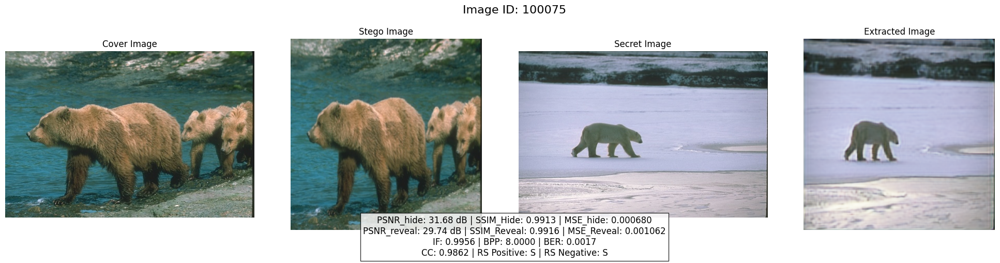


Detailed Metrics:
Image ID: 100075
--------------------------------------------------------------------------------
Capacity Metrics:
  Payload Capacity: 3705624 bits
  Bits Per Pixel (BPP): 8.000000

Image Quality Metrics:
-- Hiding --
  Mean Squared Error (MSE): 0.000680
  Peak Signal-to-Noise Ratio (PSNR): 31.6776 dB
  Structural Similarity Index (SSIM): 0.991316
  Image Fidelity (IF): 0.995590

-- Revealing --
  Mean Squared Error (MSE): 0.001062
  Peak Signal-to-Noise Ratio (PSNR): 29.7396 dB
  Structural Similarity Index (SSIM): 0.991586
  Image Fidelity (IF): 0.997855


Robustness Metrics:
  Bit Error Rate (BER): 0.001696
  2D Correlation Coefficient (CC): 0.986224
  Extraction Error Rate (RE): 0.341481

Security Metrics:
  Horizontal Variance: 32.3700
  Horizontal Std Dev: 5.6895
  Vertical Variance: 55.4941
  Vertical Std Dev: 7.4494
  Chi-Square: 0.003347

RS Analysis Metrics:
  RS Group (Positive Mask): S
  RS Group (Negative Mask): S
  RS Resistant: No
  Discriminant Origi

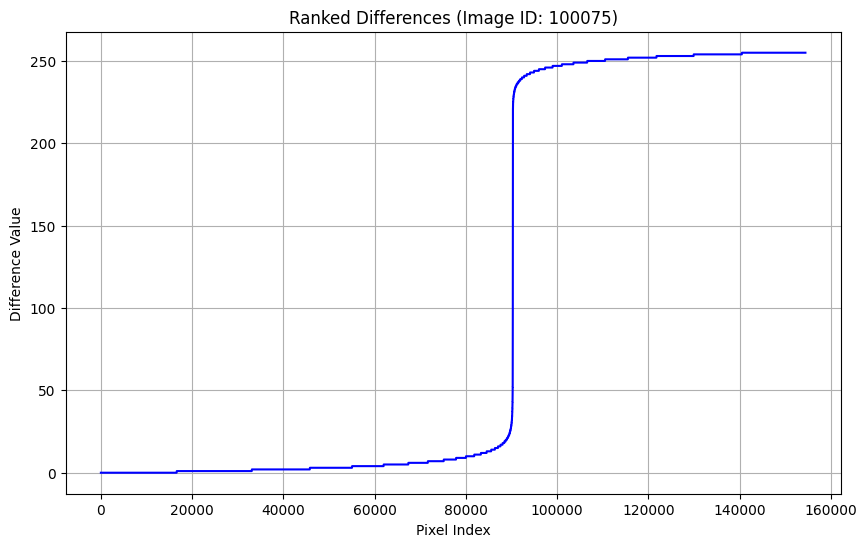

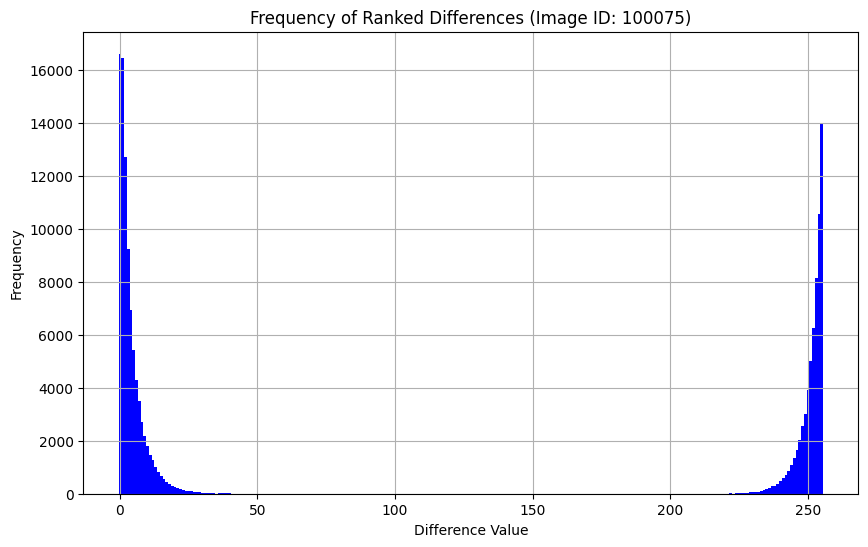

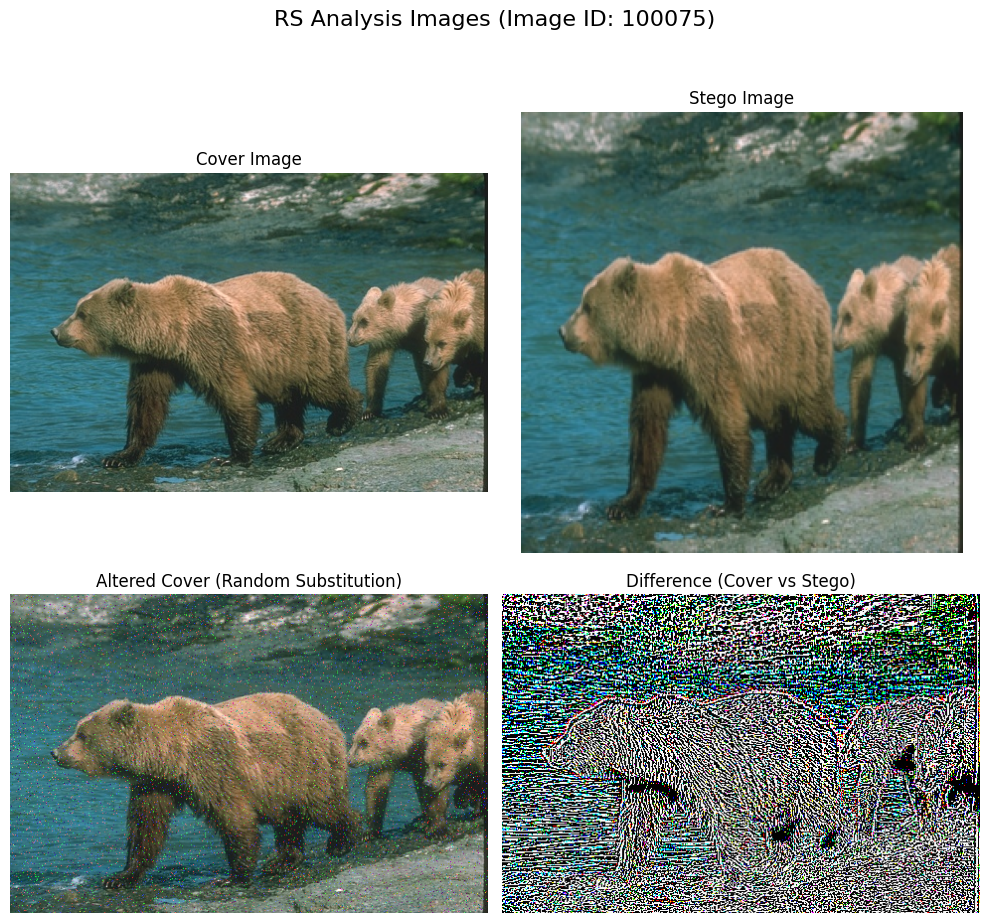

Extended RS Analysis Metrics:
  MSE (Altered Cover vs Stego): 0.006928
  Normalized MSE: 0.000000
  Ranked Differences (First 50): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0]
  Unique Values and Counts:
    Value: 0, Count: 16604
    Value: 1, Count: 16461
    Value: 2, Count: 12719
    Value: 3, Count: 9247
    Value: 4, Count: 6923
    Value: 5, Count: 5410
    Value: 6, Count: 4279
    Value: 7, Count: 3481
    Value: 8, Count: 2700
    Value: 9, Count: 2173
--------------------------------------------------------------------------------

RS Analysis (Extended) for Image ID: 100080
--------------------------------------------------------------------------------


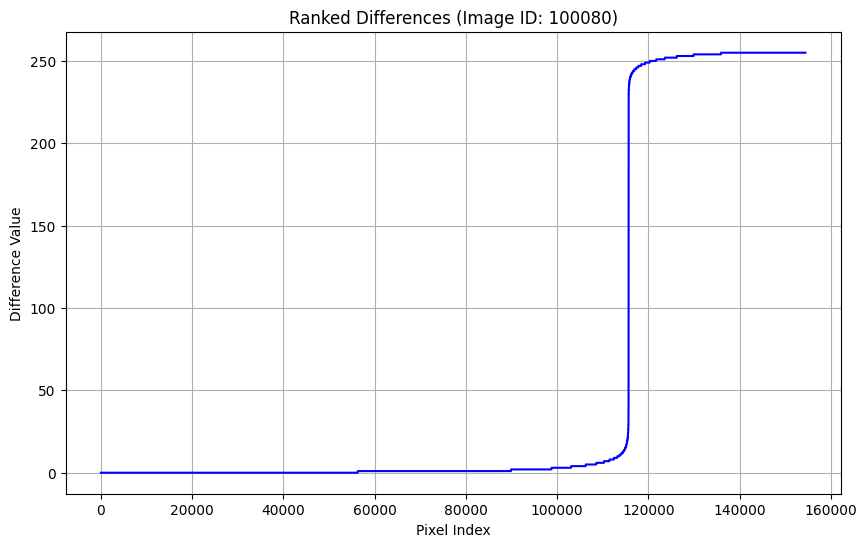

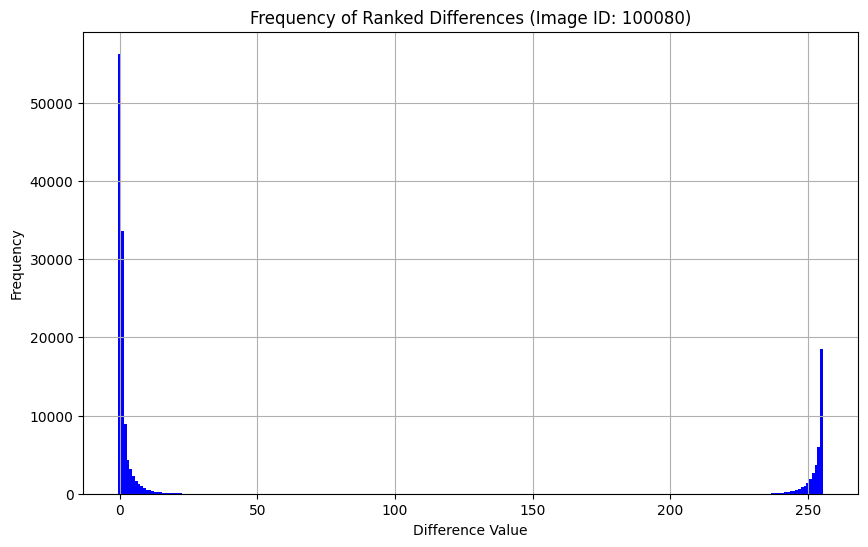

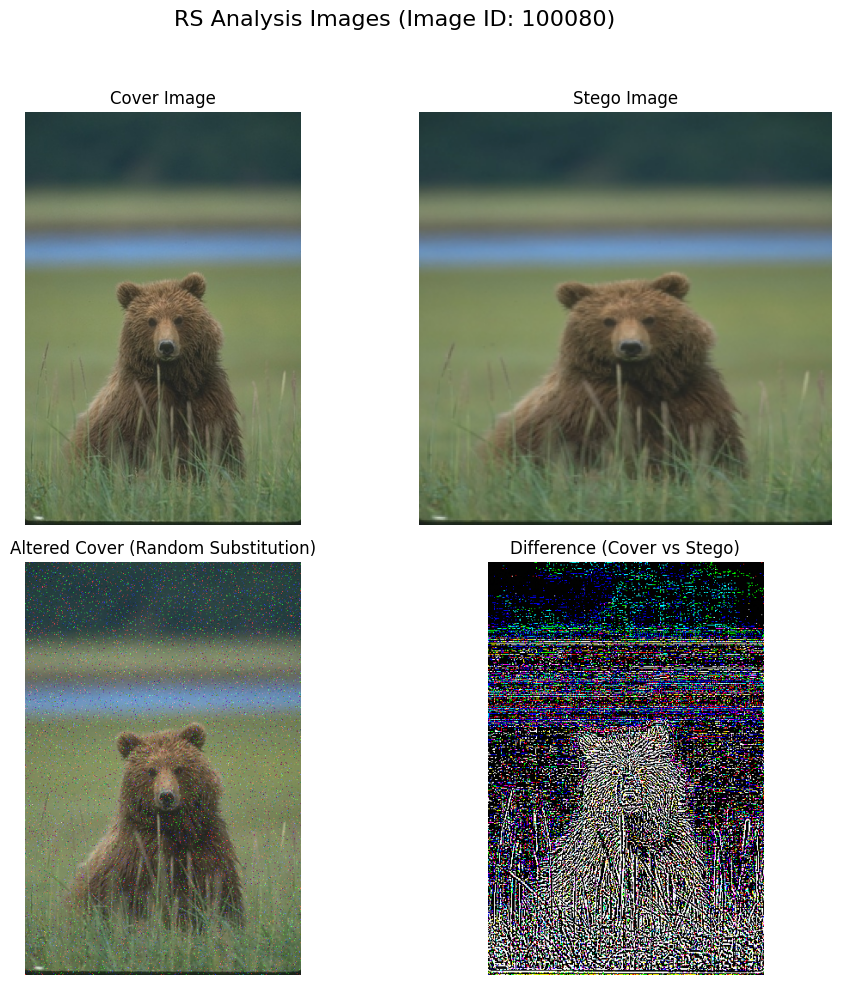

Extended RS Analysis Metrics:
  MSE (Altered Cover vs Stego): 0.005832
  Normalized MSE: 0.000000
  Ranked Differences (First 50): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0]
  Unique Values and Counts:
    Value: 0, Count: 56273
    Value: 1, Count: 33598
    Value: 2, Count: 8860
    Value: 3, Count: 4307
    Value: 4, Count: 3201
    Value: 5, Count: 2318
    Value: 6, Count: 1680
    Value: 7, Count: 1197
    Value: 8, Count: 973
    Value: 9, Count: 723
--------------------------------------------------------------------------------

RQP and SPA Analysis for Image ID: 100075
--------------------------------------------------------------------------------


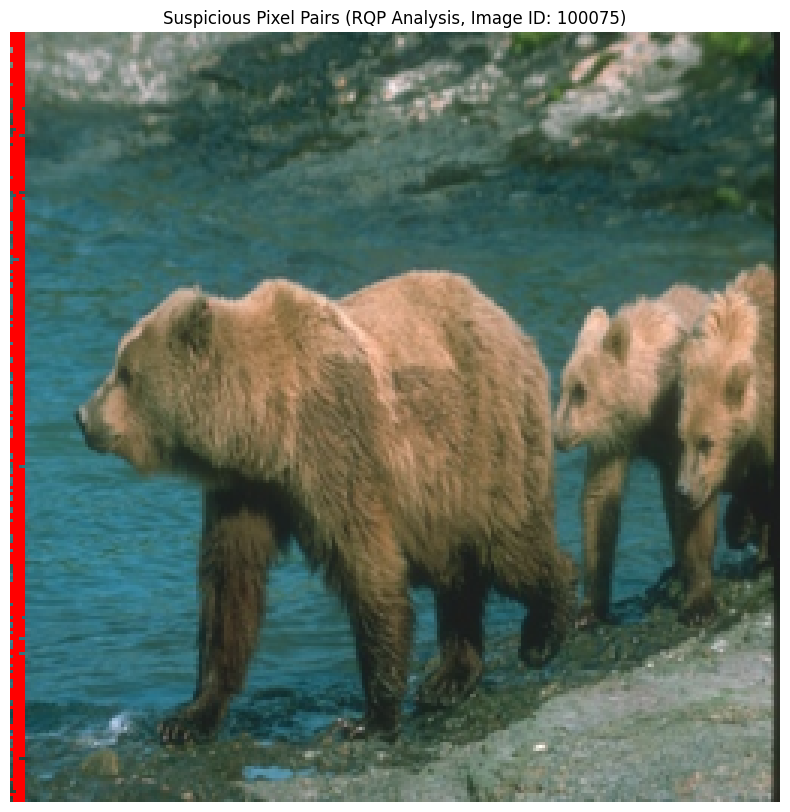

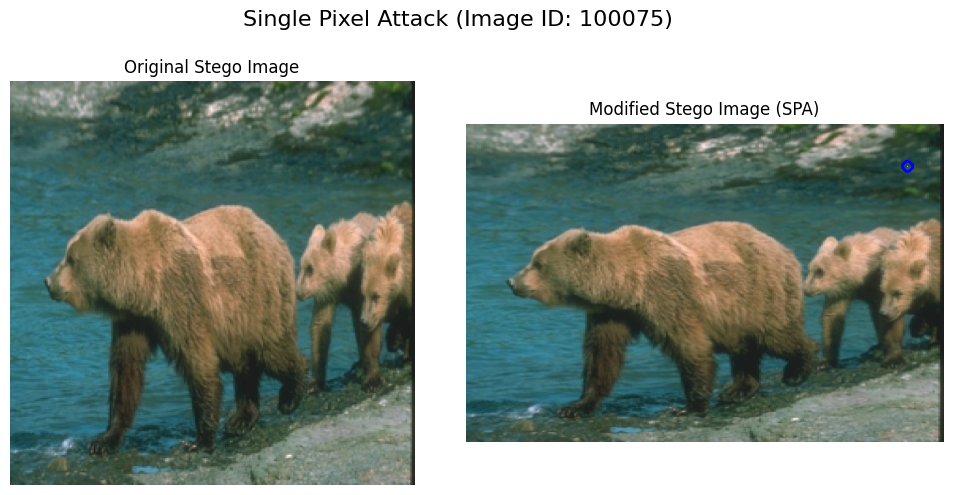

Raw Quick Pair Analysis Metrics:
  Suspicious Pair Count: 143440
  First 10 Suspicious Pairs: [((0, 0), (1, 0)), ((0, 1), (1, 1)), ((0, 2), (1, 2)), ((0, 3), (1, 3)), ((0, 4), (1, 4)), ((0, 7), (1, 7)), ((0, 8), (1, 8)), ((0, 9), (1, 9)), ((0, 12), (1, 12)), ((0, 13), (1, 13))]

Single Pixel Attack Metrics:
  Modified Pixel Position: (43, 444)
  Original Pixel Value: [41 73 65]
  Modified Pixel Value: [214 182 190]
  SSIM Before Attack: 0.9913
  SSIM After Attack: 0.8832
--------------------------------------------------------------------------------

RQP and SPA Analysis for Image ID: 100080
--------------------------------------------------------------------------------


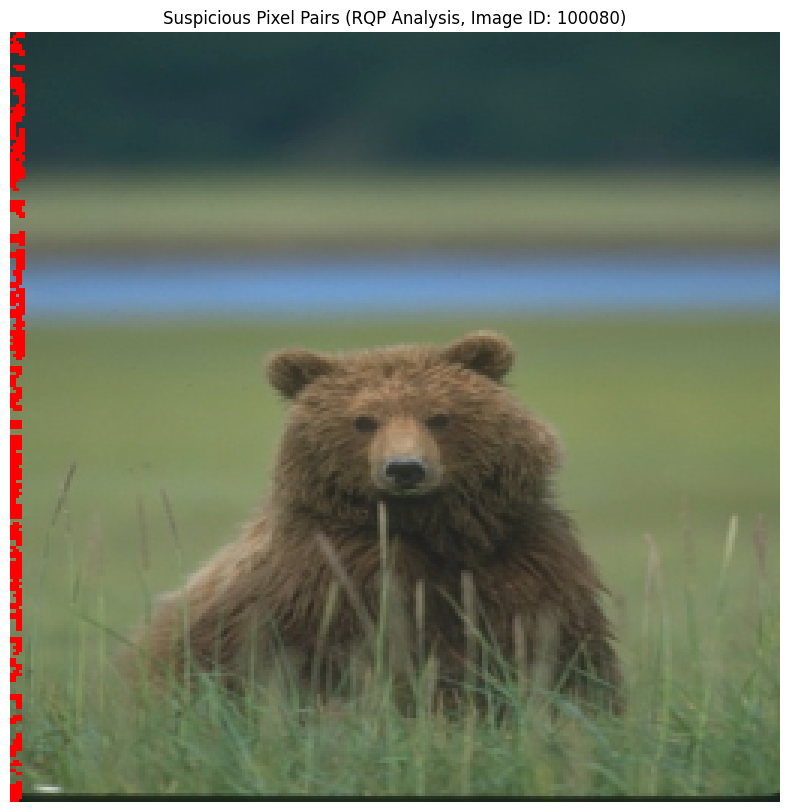

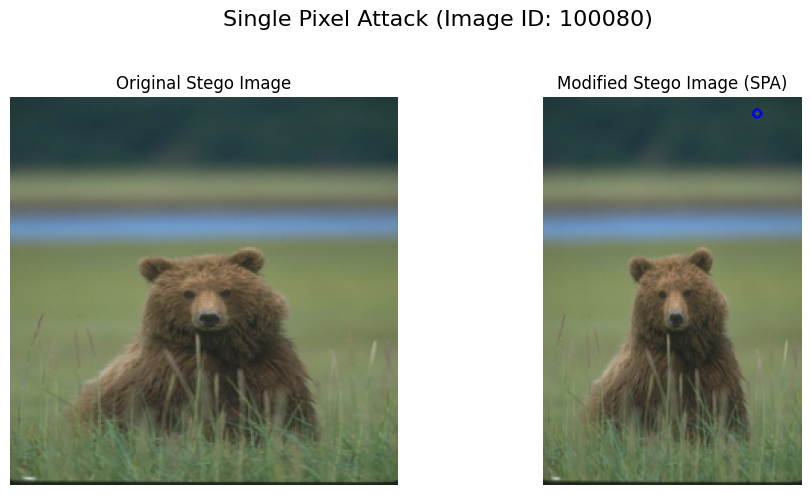

Raw Quick Pair Analysis Metrics:
  Suspicious Pair Count: 117703
  First 10 Suspicious Pairs: [((0, 2), (1, 2)), ((0, 4), (1, 4)), ((0, 5), (1, 5)), ((0, 6), (1, 6)), ((0, 15), (1, 15)), ((0, 16), (1, 16)), ((0, 17), (1, 17)), ((0, 18), (1, 18)), ((0, 25), (1, 25)), ((0, 27), (1, 27))]

Single Pixel Attack Metrics:
  Modified Pixel Position: (20, 265)
  Original Pixel Value: [41 67 64]
  Modified Pixel Value: [214 188 191]
  SSIM Before Attack: 0.9973
  SSIM After Attack: 0.9545
--------------------------------------------------------------------------------


In [ ]:
results, evaluator = run_steganography_evaluation(
     cover_dir=COVER_DIR_TRAIN,
     stego_dir=RCF_CNN_STEGO,
     secret_dir=COVER_DIR_TEST,
     extracted_dir=RCF_CNN_DECODED,
     limit=2)

## HED

Found 2 common images for evaluation
Processed image ID: 100075
Processed image ID: 100080


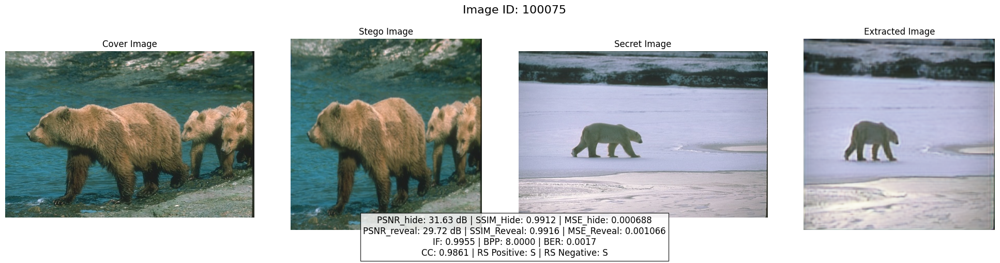


Detailed Metrics:
Image ID: 100075
--------------------------------------------------------------------------------
Capacity Metrics:
  Payload Capacity: 3705624 bits
  Bits Per Pixel (BPP): 8.000000

Image Quality Metrics:
-- Hiding --
  Mean Squared Error (MSE): 0.000688
  Peak Signal-to-Noise Ratio (PSNR): 31.6270 dB
  Structural Similarity Index (SSIM): 0.991215
  Image Fidelity (IF): 0.995538

-- Revealing --
  Mean Squared Error (MSE): 0.001066
  Peak Signal-to-Noise Ratio (PSNR): 29.7221 dB
  Structural Similarity Index (SSIM): 0.991567
  Image Fidelity (IF): 0.997847


Robustness Metrics:
  Bit Error Rate (BER): 0.001689
  2D Correlation Coefficient (CC): 0.986066
  Extraction Error Rate (RE): 0.342024

Security Metrics:
  Horizontal Variance: 32.3929
  Horizontal Std Dev: 5.6915
  Vertical Variance: 55.5226
  Vertical Std Dev: 7.4513
  Chi-Square: 0.002935

RS Analysis Metrics:
  RS Group (Positive Mask): S
  RS Group (Negative Mask): S
  RS Resistant: No
  Discriminant Origi

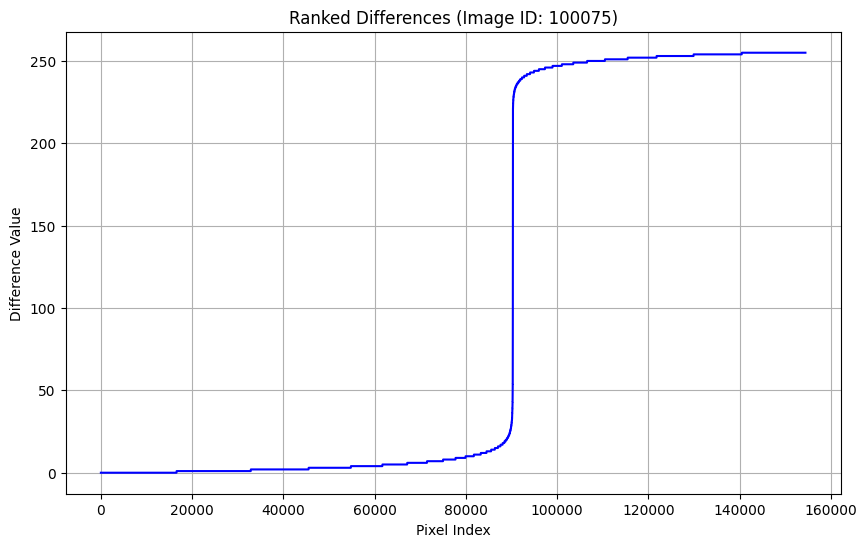

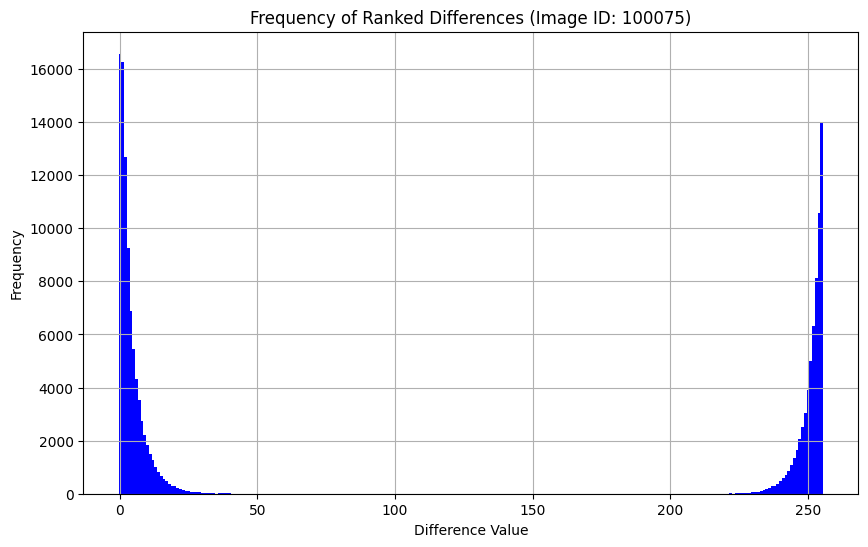

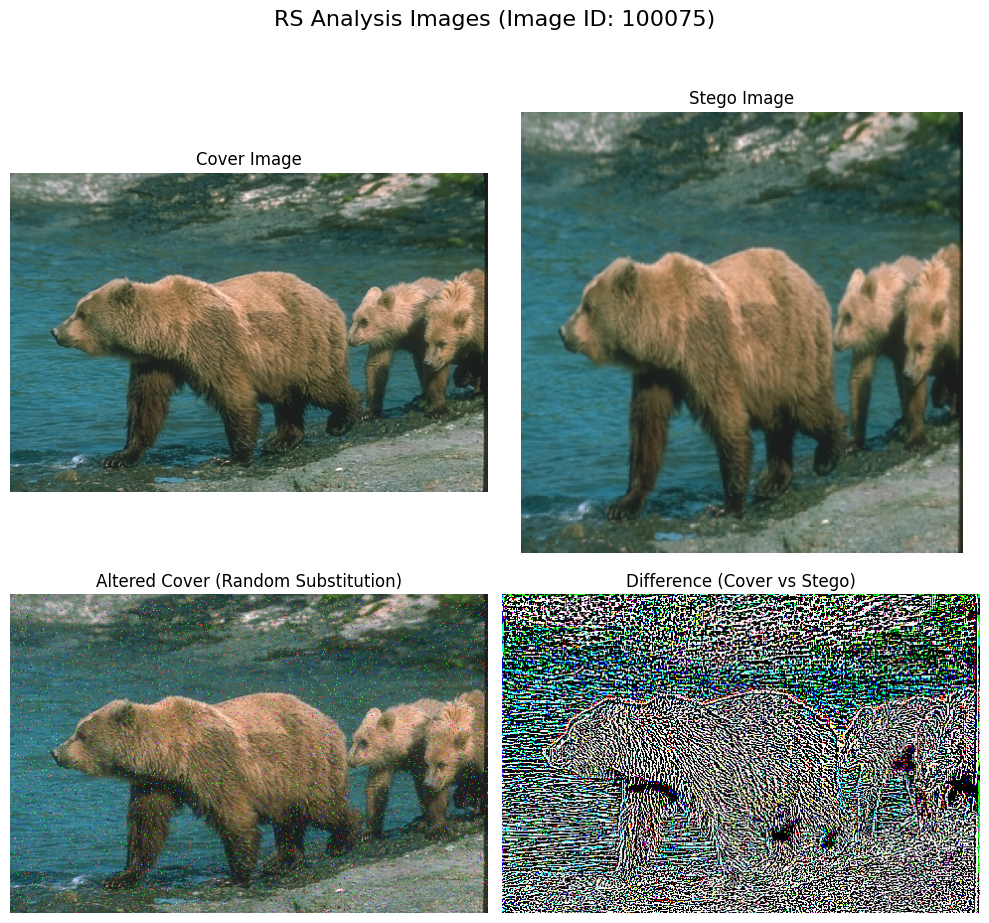

Extended RS Analysis Metrics:
  MSE (Altered Cover vs Stego): 0.006841
  Normalized MSE: 0.000000
  Ranked Differences (First 50): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0]
  Unique Values and Counts:
    Value: 0, Count: 16576
    Value: 1, Count: 16268
    Value: 2, Count: 12669
    Value: 3, Count: 9264
    Value: 4, Count: 6902
    Value: 5, Count: 5439
    Value: 6, Count: 4340
    Value: 7, Count: 3517
    Value: 8, Count: 2732
    Value: 9, Count: 2197
--------------------------------------------------------------------------------

RS Analysis (Extended) for Image ID: 100080
--------------------------------------------------------------------------------


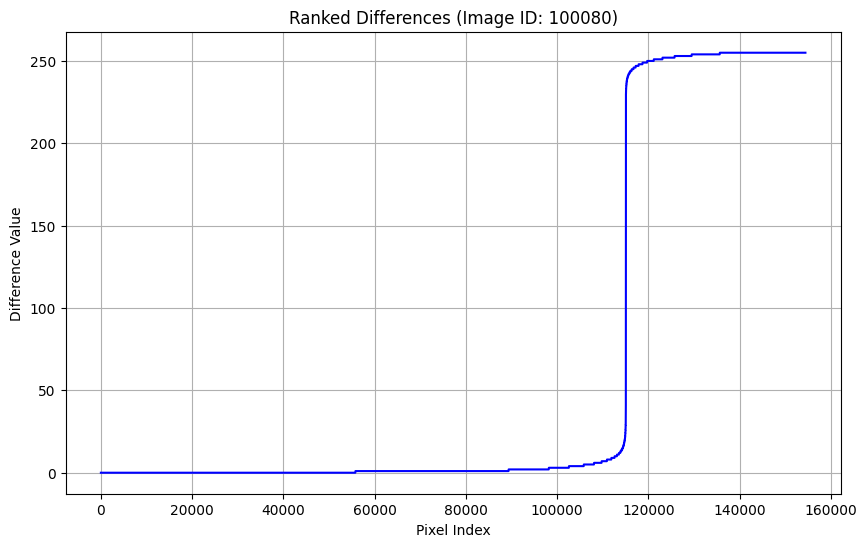

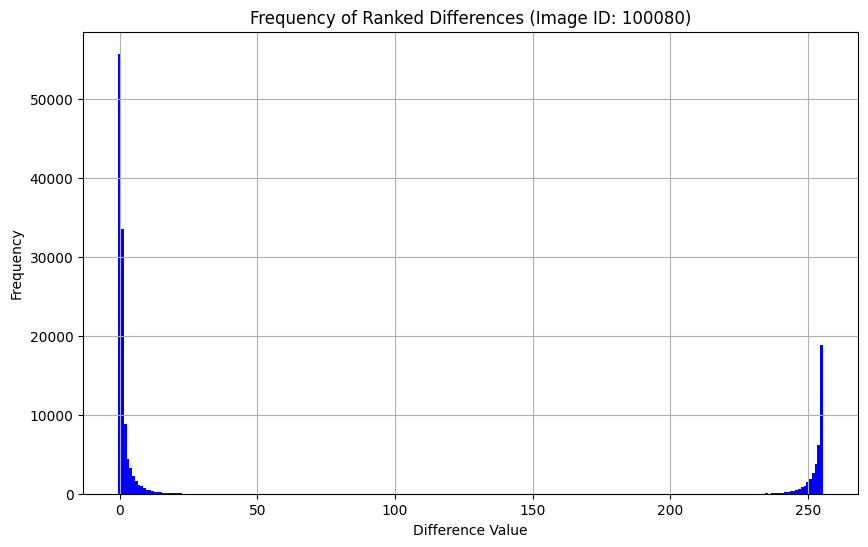

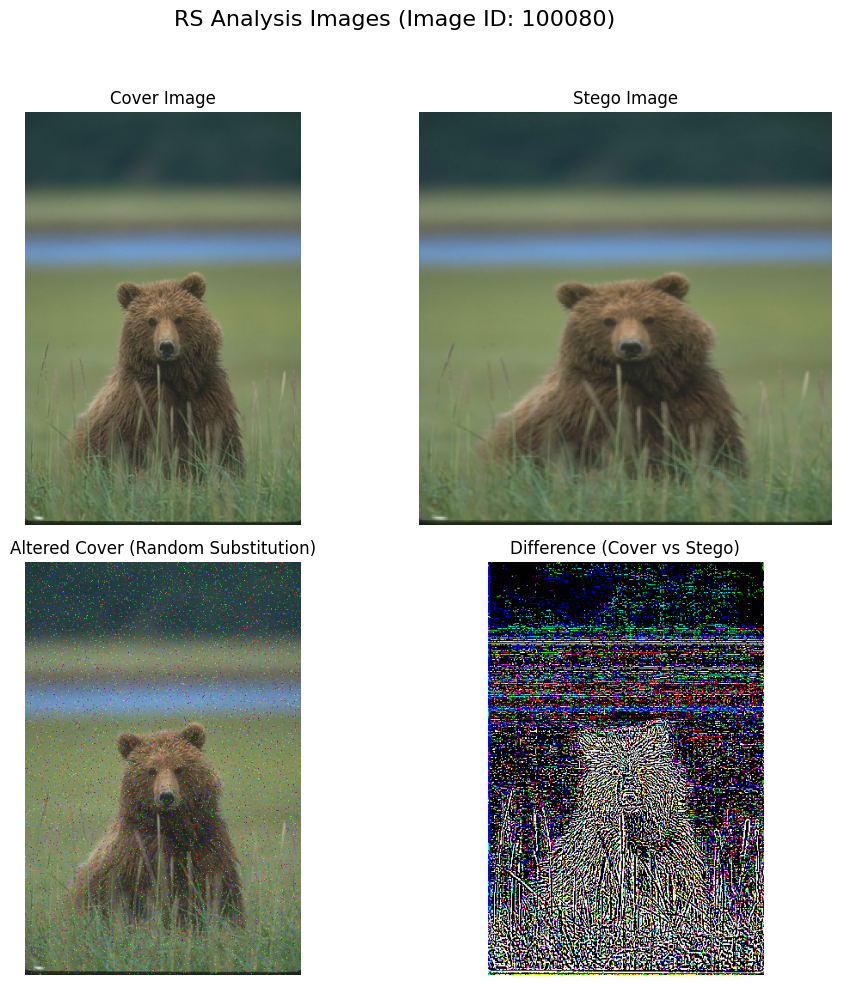

Extended RS Analysis Metrics:
  MSE (Altered Cover vs Stego): 0.005798
  Normalized MSE: 0.000000
  Ranked Differences (First 50): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0]
  Unique Values and Counts:
    Value: 0, Count: 55764
    Value: 1, Count: 33573
    Value: 2, Count: 8810
    Value: 3, Count: 4409
    Value: 4, Count: 3254
    Value: 5, Count: 2245
    Value: 6, Count: 1668
    Value: 7, Count: 1164
    Value: 8, Count: 970
    Value: 9, Count: 704
--------------------------------------------------------------------------------

RQP and SPA Analysis for Image ID: 100075
--------------------------------------------------------------------------------


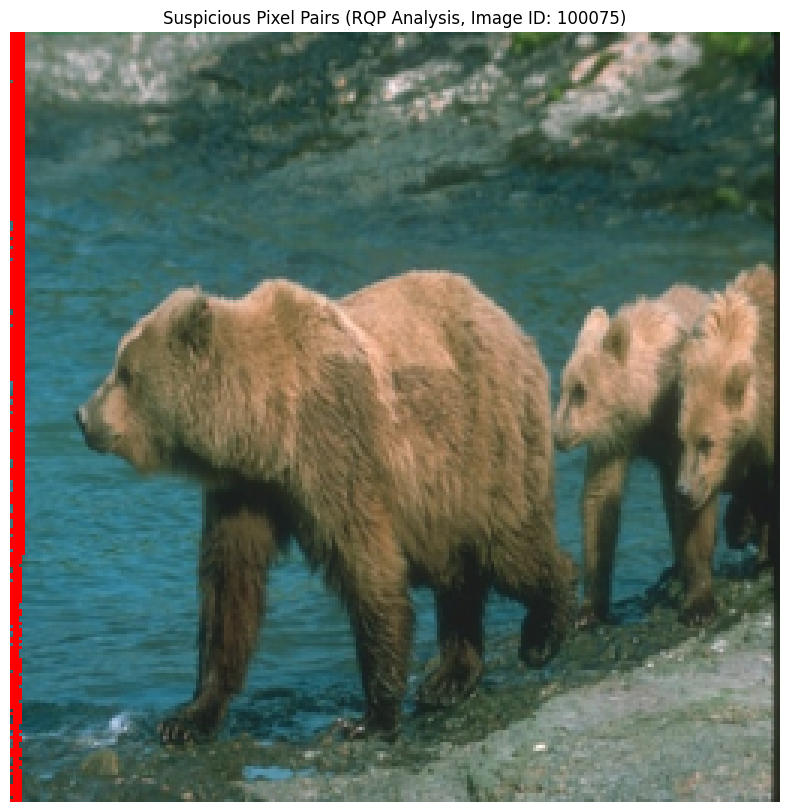

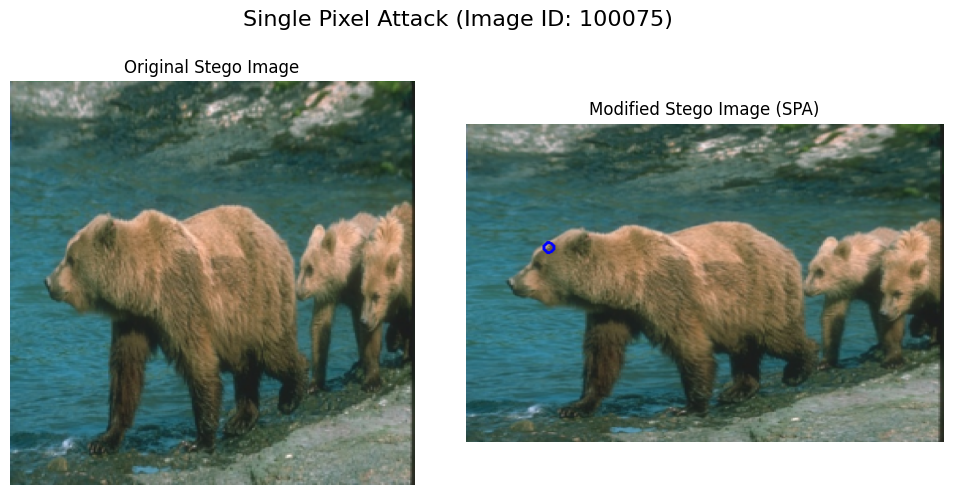

Raw Quick Pair Analysis Metrics:
  Suspicious Pair Count: 143583
  First 10 Suspicious Pairs: [((0, 0), (1, 0)), ((0, 1), (1, 1)), ((0, 2), (1, 2)), ((0, 3), (1, 3)), ((0, 4), (1, 4)), ((0, 5), (1, 5)), ((0, 6), (1, 6)), ((0, 7), (1, 7)), ((0, 8), (1, 8)), ((0, 9), (1, 9))]

Single Pixel Attack Metrics:
  Modified Pixel Position: (125, 83)
  Original Pixel Value: [113  98  70]
  Modified Pixel Value: [142 157 185]
  SSIM Before Attack: 0.9912
  SSIM After Attack: 0.8833
--------------------------------------------------------------------------------

RQP and SPA Analysis for Image ID: 100080
--------------------------------------------------------------------------------


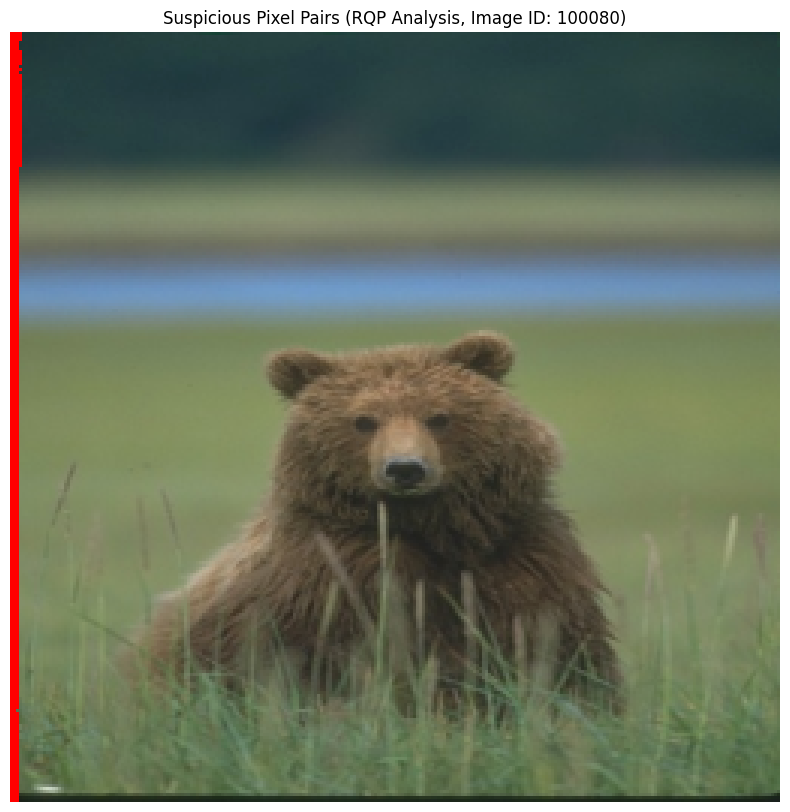

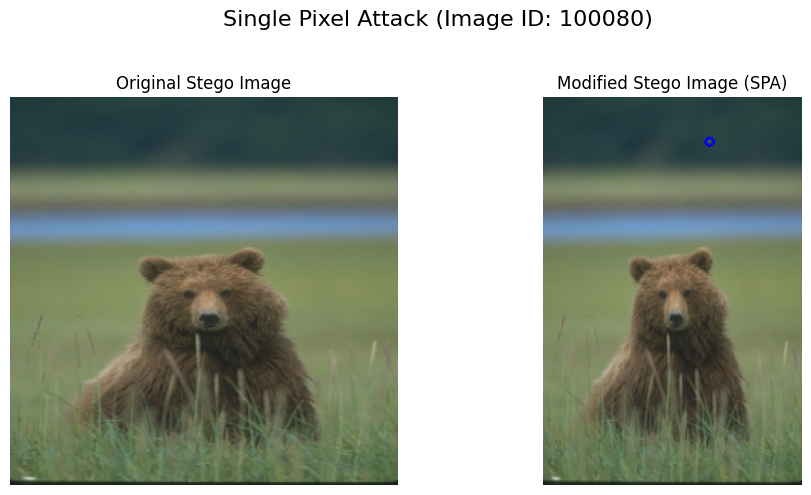

Raw Quick Pair Analysis Metrics:
  Suspicious Pair Count: 118345
  First 10 Suspicious Pairs: [((0, 0), (1, 0)), ((0, 1), (1, 1)), ((0, 2), (1, 2)), ((0, 3), (1, 3)), ((0, 4), (1, 4)), ((0, 5), (1, 5)), ((0, 6), (1, 6)), ((0, 7), (1, 7)), ((0, 8), (1, 8)), ((0, 9), (1, 9))]

Single Pixel Attack Metrics:
  Modified Pixel Position: (55, 206)
  Original Pixel Value: [41 68 67]
  Modified Pixel Value: [214 187 188]
  SSIM Before Attack: 0.9972
  SSIM After Attack: 0.9545
--------------------------------------------------------------------------------


In [ ]:
results, evaluator = run_steganography_evaluation(
     cover_dir=COVER_DIR_TRAIN,
     stego_dir=RCF_CNN_STEGO,
     secret_dir=COVER_DIR_TEST,
     extracted_dir=RCF_CNN_DECODED,
     limit=2)